In [1]:
import sys
sys.path.append('../')

import pandas as pd
import numpy as np
from scipy import stats, signal
from sklearn.model_selection import train_test_split, cross_val_score, KFold
from sklearn.metrics import accuracy_score, f1_score, precision_score, recall_score, confusion_matrix, balanced_accuracy_score, roc_auc_score
from utils import load_data, feature_selection, plot_graphs, preprocessing
from imblearn.over_sampling import SMOTE, KMeansSMOTE
from models import train
import pyswarms as ps
from pyswarms.discrete.binary import BinaryPSO
import matplotlib.pyplot as plt
from pyswarms.utils.plotters import plot_contour, plot_surface
from pyswarms.utils.plotters.formatters import Designer
from pyswarms.utils.plotters.formatters import Mesher
import pygad
import optuna
from optuna.samplers import TPESampler, CmaEsSampler
from optuna.visualization import plot_contour
from optuna.visualization import plot_edf
from optuna.visualization import plot_intermediate_values
from optuna.visualization import plot_optimization_history
from optuna.visualization import plot_parallel_coordinate
from optuna.visualization import plot_param_importances
from optuna.visualization import plot_slice
from catboost import CatBoostClassifier, Pool
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier

In [2]:
def fit_model_f1(model, X_train, X_test, y_train, y_test):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    f1 = f1_score(y_test, pred)

    return f1
    

def fit_model_no_train_test(model, X_train, X_test, y_train, y_test, method):

    model.fit(X_train, y_train)
    pred = model.predict(X_test)
    print('ACCURACY:', round(accuracy_score(y_test, pred), 3))
    print('BALANCED ACCURACY', round(balanced_accuracy_score(y_test, pred), 3))
    print('F-SCORE:', round(f1_score(y_test, pred), 3))
    print('PRECISION:', round(precision_score(y_test, pred), 3))
    print('RECALL:', round(recall_score(y_test, pred), 3))
    print('AUC ROC:', round(roc_auc_score(y_test, pred), 3))

    df_metrics = pd.DataFrame(index=['ACCURACY', 'BALANCED ACCURACY', 
        'F-SCORE', 'PRECISION', 'RECALL', 'AUC ROC'], data={method: [round(accuracy_score(y_test, pred), 3), 
                                                                    round(balanced_accuracy_score(y_test, pred), 3),
                                                                    round(f1_score(y_test, pred), 3),
                                                                    round(precision_score(y_test, pred), 3),
                                                                    round(recall_score(y_test, pred), 3),
                                                                    round(roc_auc_score(y_test, pred), 3)]})
    return model, df_metrics

In [35]:
# DATA RAW

df_train = pd.read_excel('treinamento-raw.xlsx').set_index('Sample')
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx').set_index('Sample')
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

X_train_array = X_train.copy()
X_test_array = X_test.copy()

# SNV
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-raw-features.xlsx')

X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')
X_features_test.to_excel('teste-features.xlsx')


print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape, X_features_test.shape)
# print(y_train.shape, y_test.shape)

(535, 125) (179, 125)
(535, 312) (179, 312)


In [4]:
import xgboost
model = xgboost.Booster()
model.load_model('model_features_xgboost.json')

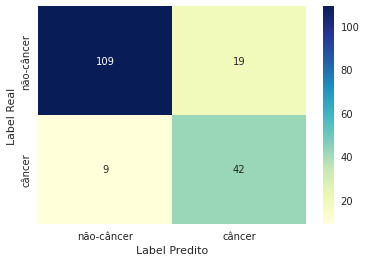

In [5]:
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
import seaborn as sns


preds = [1 if x > 0.5 else 0 for x in model.predict(xgboost.DMatrix(X_features_test))]
cm = confusion_matrix(y_test, preds)


ax = plt.subplot()
sns.heatmap(cm, annot=True, fmt='g', ax=ax, cmap='YlGnBu');  #annot=True to annotate cells, ftm='g' to disable scientific notation

# labels, title and ticks
ax.set_xlabel('Label Predito');ax.set_ylabel('Label Real')
# ax.set_title('Confusion Matrix'); 
ax.xaxis.set_ticklabels(['não-câncer', 'câncer']); ax.yaxis.set_ticklabels(['não-câncer', 'câncer'])
plt.savefig('confusion_matrix_modeling.jpg', dpi=300, bbox_inches='tight')

In [5]:
# DATA SMOTE

df_train = pd.read_excel('treinamento-smote.xlsx', index_col=0)
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-smote.xlsx', index_col=0)
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

X_train_array = X_train.copy()
X_test_array = X_test.copy()

# SNV
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-smote-features.xlsx')

X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')
X_features_test.to_excel('teste-features.xlsx')

print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape)
# print(y_train.shape, y_test.shape)

(768, 125) (179, 125)
(768, 312)


In [5]:
# DATA PCA

df_train = pd.read_excel('treinamento-pca.xlsx', index_col=0)
X_train = df_train.drop(['y'], axis=1)
y_train = df_train['y'].to_numpy()
df_train = X_train.copy()
df_train['y'] = y_train

df_test = pd.read_excel('teste-raw.xlsx', index_col=0)
X_test = df_test.drop(['y'], axis=1)
y_test = df_test['y'].to_numpy()
df_test = X_test.copy()
df_test['y'] = y_test

# SNV
X_train_array = X_train.copy()
X_test_array = X_test.copy()

# # SNV + Features
X_snv_train = pd.DataFrame(preprocessing.SNV(X_train), columns=X_train.columns)
X_snv_test = pd.DataFrame(preprocessing.SNV(X_test), columns=X_test.columns)

# GENERATE FEATURES DATASET
X_features_train = preprocessing.create_features(
        X_snv_train, n_subsets=26, mode='stats')
X_features_train.to_excel('treinamento-pca-features.xlsx')

X_features_test = preprocessing.create_features(
        X_snv_test, n_subsets=26, mode='stats')
X_features_test.to_excel('teste-features.xlsx')

print(X_snv_train.shape, X_snv_test.shape)
print(X_features_train.shape)
# print(y_train.shape, y_test.shape)

(768, 125) (179, 125)
(768, 312)


#### Optuna for binary classification - XGBoost

In [7]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-04-02 21:06:42,063] A new study created in memory with name: no-name-9658d63b-9344-4989-98f0-30733e5a97b3
[I 2023-04-02 21:06:42,568] Trial 0 finished with value: 0.5000001 and parameters: {'scale_pos_weight': 6, 'max_depth': 12, 'n_estimators': 65, 'learning_rate': 0.06270181309020814, 'colsample_bytree': 0.5042264394223082, 'subsample': 0.8044649340202231, 'reg_alpha': 7, 'reg_lambda': 12}. Best is trial 0 with value: 0.5000001.
[I 2023-04-02 21:06:42,756] Trial 1 finished with value: 0.44230779230769224 and parameters: {'scale_pos_weight': 19, 'max_depth': 3, 'n_estimators': 47, 'learning_rate': 0.40292362751581096, 'colsample_bytree': 0.6444688569388632, 'subsample': 0.14282834032585562, 'reg_alpha': 7, 'reg_lambda': 3}. Best is trial 0 with value: 0.5000001.
[I 2023-04-02 21:06:42,875] Trial 2 finished with value: 0.5025642025641026 and parameters: {'scale_pos_weight': 11, 'max_depth': 13, 'n_estimators': 13, 'learning_rate': 0.4042307755845349, 'colsample_bytree': 0.51533

Number of finished trials: 200
Best trial:
Value: 0.5846154846153846
Params: 
scale_pos_weight: 2
max_depth: 10
n_estimators: 50
learning_rate: 0.053717974525911635
colsample_bytree: 0.9637162981851356
subsample: 0.8806788862338062
reg_alpha: 3
reg_lambda: 3
ACCURACY: 0.698
BALANCED ACCURACY 0.712
F-SCORE: 0.585
PRECISION: 0.481
RECALL: 0.745
AUC ROC: 0.712


,xgboost
ACCURACY,0.698
BALANCED ACCURACY,0.712
F-SCORE,0.585
PRECISION,0.481
RECALL,0.745
AUC ROC,0.712


In [8]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-04-02 21:10:49,379] A new study created in memory with name: no-name-735ad645-a2af-42e4-bd8a-e53105c8d078
[I 2023-04-02 21:10:50,163] Trial 0 finished with value: 0.4776120402985075 and parameters: {'scale_pos_weight': 21, 'max_depth': 12, 'n_estimators': 91, 'learning_rate': 0.07436614578434488, 'colsample_bytree': 0.9743605162429658, 'subsample': 0.6348928258615176, 'reg_alpha': 16, 'reg_lambda': 1}. Best is trial 0 with value: 0.4776120402985075.
[I 2023-04-02 21:10:50,343] Trial 1 finished with value: 0.4474886844748859 and parameters: {'scale_pos_weight': 7, 'max_depth': 4, 'n_estimators': 26, 'learning_rate': 0.08625358653055805, 'colsample_bytree': 0.849790165556068, 'subsample': 0.8135616050345212, 'reg_alpha': 19, 'reg_lambda': 10}. Best is trial 0 with value: 0.4776120402985075.
[I 2023-04-02 21:10:50,628] Trial 2 finished with value: 0.4945055945054946 and parameters: {'scale_pos_weight': 13, 'max_depth': 7, 'n_estimators': 55, 'learning_rate': 0.38016689865881226, '

Number of finished trials: 200
Best trial:
Value: 0.6400000999999998
Params: 
scale_pos_weight: 3
max_depth: 4
n_estimators: 97
learning_rate: 0.6773876476618828
colsample_bytree: 0.5640031774760692
subsample: 0.6981335169748469
reg_alpha: 1
reg_lambda: 15
ACCURACY: 0.749
BALANCED ACCURACY 0.759
F-SCORE: 0.64
PRECISION: 0.541
RECALL: 0.784
AUC ROC: 0.759


,xgboost
ACCURACY,0.749
BALANCED ACCURACY,0.759
F-SCORE,0.640
PRECISION,0.541
RECALL,0.784
AUC ROC,0.759


In [9]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        "objective": "binary:logistic",
        "eval_metric": "auc",
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 25),
        'max_depth': trial.suggest_int('max_depth', 1, 15, step=1),
        'n_estimators': trial.suggest_int('n_estimators', 10, 100),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1),
        'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1),
        'subsample': trial.suggest_float('subsample', 0.1, 1),
        'reg_alpha': trial.suggest_int('reg_alpha', 0, 20, step=1),
        'reg_lambda': trial.suggest_int('reg_lambda', 0, 20, step=1)
    }

    model = XGBClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=10000)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    "objective": "binary:logistic",
    "eval_metric": "auc",
    "scale_pos_weight": trial.params['scale_pos_weight'],
    "max_depth": trial.params['max_depth'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "colsample_bytree": trial.params['colsample_bytree'],
    "subsample": trial.params['subsample'],
    "reg_alpha": trial.params['reg_alpha'],
    "reg_lambda": trial.params['reg_lambda']
    }

model = XGBClassifier(**params)

model, df_metrics_xgboost = fit_model_no_train_test(model, 
    X_features_train, X_features_test, y_train, y_test, 'xgboost')

df_metrics_xgboost

[I 2023-04-02 21:12:06,733] A new study created in memory with name: no-name-73ab1a1f-3ff5-4711-80dc-64390f733223
[I 2023-04-02 21:12:07,185] Trial 0 finished with value: 0.6259542984732823 and parameters: {'scale_pos_weight': 5, 'max_depth': 5, 'n_estimators': 72, 'learning_rate': 0.9841061286238009, 'colsample_bytree': 0.7654089484912765, 'subsample': 0.5458905315342405, 'reg_alpha': 20, 'reg_lambda': 16}. Best is trial 0 with value: 0.6259542984732823.
[I 2023-04-02 21:12:07,583] Trial 1 finished with value: 0.5954199473282441 and parameters: {'scale_pos_weight': 6, 'max_depth': 13, 'n_estimators': 31, 'learning_rate': 0.758016947421216, 'colsample_bytree': 0.9803137896961309, 'subsample': 0.947250998381844, 'reg_alpha': 16, 'reg_lambda': 14}. Best is trial 0 with value: 0.6259542984732823.
[I 2023-04-02 21:12:07,907] Trial 2 finished with value: 0.5276074619631901 and parameters: {'scale_pos_weight': 16, 'max_depth': 12, 'n_estimators': 18, 'learning_rate': 0.25341069482323925, 'co

Number of finished trials: 10000
Best trial:
Value: 0.7608696652173912
Params: 
scale_pos_weight: 1
max_depth: 5
n_estimators: 53
learning_rate: 0.299458991009559
colsample_bytree: 0.9835413604651141
subsample: 0.8709359436056786
reg_alpha: 8
reg_lambda: 9
ACCURACY: 0.877
BALANCED ACCURACY 0.82
F-SCORE: 0.761
PRECISION: 0.854
RECALL: 0.686
AUC ROC: 0.82


,xgboost
ACCURACY,0.877
BALANCED ACCURACY,0.820
F-SCORE,0.761
PRECISION,0.854
RECALL,0.686
AUC ROC,0.820


In [18]:
model.save_model("model_features_xgboost.json")

#### Optuna for binary classification - Catboost

In [10]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }

model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'catboost')

df_metrics

[I 2023-04-03 08:34:26,855] A new study created in memory with name: no-name-1a89ecc6-a2eb-41f1-a4e0-363cef92e0d6
[I 2023-04-03 08:34:27,883] Trial 0 finished with value: 0.45871569633027526 and parameters: {'max_depth': 12, 'l2_leaf_reg': 3, 'n_estimators': 4, 'rsm': 0.3559491867717878, 'learning_rate': 0.9559935317594364}. Best is trial 0 with value: 0.45871569633027526.
[I 2023-04-03 08:34:39,824] Trial 1 finished with value: 0.5357143857142858 and parameters: {'max_depth': 11, 'l2_leaf_reg': 18, 'n_estimators': 149, 'rsm': 0.28362123799930977, 'learning_rate': 0.36028134489592095}. Best is trial 1 with value: 0.5357143857142858.
[I 2023-04-03 08:34:53,335] Trial 2 finished with value: 0.5454546454545454 and parameters: {'max_depth': 11, 'l2_leaf_reg': 30, 'n_estimators': 136, 'rsm': 0.35888782270787767, 'learning_rate': 0.5812603476553504}. Best is trial 2 with value: 0.5454546454545454.
[I 2023-04-03 08:35:37,651] Trial 3 finished with value: 0.5090910090909091 and parameters: {'m

Number of finished trials: 200
Best trial:
Value: 0.5765766765765765
Params: 
max_depth: 2
l2_leaf_reg: 25
n_estimators: 54
rsm: 0.3341886001979978
learning_rate: 0.5422724638091033
ACCURACY: 0.737
BALANCED ACCURACY 0.704
F-SCORE: 0.577
PRECISION: 0.533
RECALL: 0.627
AUC ROC: 0.704


,catboost
ACCURACY,0.737
BALANCED ACCURACY,0.704
F-SCORE,0.577
PRECISION,0.533
RECALL,0.627
AUC ROC,0.704


In [11]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }

model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'catboost')

df_metrics

[I 2023-04-03 09:24:00,094] A new study created in memory with name: no-name-e9328429-42a6-4b85-9ea5-df13547ef46c
[I 2023-04-03 09:24:06,484] Trial 0 finished with value: 0.5486726663716813 and parameters: {'max_depth': 9, 'l2_leaf_reg': 37, 'n_estimators': 171, 'rsm': 0.17033924505489917, 'learning_rate': 0.10817093773910315}. Best is trial 0 with value: 0.5486726663716813.
[I 2023-04-03 09:24:15,911] Trial 1 finished with value: 0.542056174766355 and parameters: {'max_depth': 14, 'l2_leaf_reg': 5, 'n_estimators': 5, 'rsm': 0.6853280089739701, 'learning_rate': 0.026351034931214712}. Best is trial 0 with value: 0.5486726663716813.
[I 2023-04-03 09:33:45,800] Trial 2 finished with value: 0.5321101917431192 and parameters: {'max_depth': 15, 'l2_leaf_reg': 24, 'n_estimators': 124, 'rsm': 0.8614575773989319, 'learning_rate': 0.25296338530431484}. Best is trial 0 with value: 0.5486726663716813.
[I 2023-04-03 09:34:05,438] Trial 3 finished with value: 0.5000001 and parameters: {'max_depth': 

Number of finished trials: 200
Best trial:
Value: 0.5964913280701754
Params: 
max_depth: 4
l2_leaf_reg: 21
n_estimators: 194
rsm: 0.37799033019805234
learning_rate: 0.9019659827422897
ACCURACY: 0.743
BALANCED ACCURACY 0.72
F-SCORE: 0.596
PRECISION: 0.54
RECALL: 0.667
AUC ROC: 0.72


,catboost
ACCURACY,0.743
BALANCED ACCURACY,0.720
F-SCORE,0.596
PRECISION,0.540
RECALL,0.667
AUC ROC,0.720


In [7]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'verbose': 0,
        'random_seed': 1066,
        # 'boosting_type': trial.suggest_categorical("boosting_type", ["Ordered", "Plain"]),
        # 'objective': trial.suggest_categorical("objective", ["Logloss", "CrossEntropy"]),
        'max_depth': trial.suggest_int('max_depth', 1, 16), 
        'l2_leaf_reg': trial.suggest_int('l2_leaf_reg', 1, 40),
        'n_estimators': trial.suggest_int('n_estimators', 1, 200),
        'rsm': trial.suggest_float('rsm', 0.1, 1.0),
        'learning_rate': trial.suggest_float('learning_rate', 0.01, 1)
    }

    model = CatBoostClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
        'verbose': 0,
        'random_seed': 1066,
        'max_depth': trial.params['max_depth'], 
        'l2_leaf_reg': trial.params['l2_leaf_reg'],
        'n_estimators': trial.params['n_estimators'],
        'rsm': trial.params['rsm'],
        'learning_rate': trial.params['learning_rate']
    }


model = CatBoostClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_features_train, X_features_test, y_train, y_test, 'catboost')

df_metrics

[I 2023-04-03 23:14:39,255] A new study created in memory with name: no-name-c199e0b7-4def-445d-8ba9-94f165e15a97
[I 2023-04-03 23:14:42,595] Trial 0 finished with value: 0.5681819181818181 and parameters: {'max_depth': 4, 'l2_leaf_reg': 33, 'n_estimators': 142, 'rsm': 0.5112289074160926, 'learning_rate': 0.5062238082772554}. Best is trial 0 with value: 0.5681819181818181.
[I 2023-04-03 23:15:44,949] Trial 1 finished with value: 0.5714286714285715 and parameters: {'max_depth': 13, 'l2_leaf_reg': 27, 'n_estimators': 34, 'rsm': 0.6523936004834375, 'learning_rate': 0.5007612142495214}. Best is trial 1 with value: 0.5714286714285715.
[I 2023-04-03 23:16:15,458] Trial 2 finished with value: 0.5825243718446601 and parameters: {'max_depth': 10, 'l2_leaf_reg': 8, 'n_estimators': 195, 'rsm': 0.4515874120870753, 'learning_rate': 0.43610533475761615}. Best is trial 2 with value: 0.5825243718446601.
[I 2023-04-03 23:21:53,879] Trial 3 finished with value: 0.6605505587155963 and parameters: {'max_d

Number of finished trials: 200
Best trial:
Value: 0.6990292262135923
Params: 
max_depth: 13
l2_leaf_reg: 29
n_estimators: 73
rsm: 0.6665154097267323
learning_rate: 0.4455540437979397
ACCURACY: 0.827
BALANCED ACCURACY 0.79
F-SCORE: 0.699
PRECISION: 0.692
RECALL: 0.706
AUC ROC: 0.79


,catboost
ACCURACY,0.827
BALANCED ACCURACY,0.790
F-SCORE,0.699
PRECISION,0.692
RECALL,0.706
AUC ROC,0.790


#### Optuna optimization - LGBM

In [28]:
# NO PREPROCESSING

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_train_array, X_test_array, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model = LGBMClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_train_array, X_test_array, y_train, y_test, 'lgbm')

df_metrics

[I 2023-03-21 08:59:20,941] A new study created in memory with name: no-name-a0da4c47-609c-49a0-aaee-380161890f95
[I 2023-03-21 08:59:24,842] Trial 0 finished with value: 0.5252526252525253 and parameters: {'scale_pos_weight': 15, 'n_estimators': 55, 'learning_rate': 0.5565347603126582, 'num_leaves': 5000, 'max_depth': 9}. Best is trial 0 with value: 0.5252526252525253.
[I 2023-03-21 08:59:25,696] Trial 1 finished with value: 0.37894746842105265 and parameters: {'scale_pos_weight': 2, 'n_estimators': 13, 'learning_rate': 0.9295858706956079, 'num_leaves': 3700, 'max_depth': 10}. Best is trial 0 with value: 0.5252526252525253.
[I 2023-03-21 08:59:28,377] Trial 2 finished with value: 0.47058833529411764 and parameters: {'scale_pos_weight': 15, 'n_estimators': 78, 'learning_rate': 0.27464151458483466, 'num_leaves': 3320, 'max_depth': 8}. Best is trial 0 with value: 0.5252526252525253.
[I 2023-03-21 08:59:32,317] Trial 3 finished with value: 0.5252526252525253 and parameters: {'scale_pos_we

Number of finished trials: 200
Best trial:
Value: 0.5684211526315789
Params: 
scale_pos_weight: 3
n_estimators: 73
learning_rate: 0.16133747957993408
num_leaves: 2060
max_depth: 10
ACCURACY: 0.771
BALANCED ACCURACY 0.698
F-SCORE: 0.568
PRECISION: 0.614
RECALL: 0.529
AUC ROC: 0.698


,lgbm
ACCURACY,0.771
BALANCED ACCURACY,0.698
F-SCORE,0.568
PRECISION,0.614
RECALL,0.529
AUC ROC,0.698


In [14]:
# SNV

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_snv_train, X_snv_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=200)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model = LGBMClassifier(**params)

model, df_metrics = fit_model_no_train_test(model, 
    X_snv_train, X_snv_test, y_train, y_test, 'lgbm')

df_metrics

[I 2023-04-03 21:22:16,713] A new study created in memory with name: no-name-39a519fd-29c9-47e3-8f84-275110143113
[I 2023-04-03 21:22:17,098] Trial 0 finished with value: 0.5511812023622046 and parameters: {'scale_pos_weight': 4, 'n_estimators': 28, 'learning_rate': 0.3429600163400162, 'num_leaves': 2680, 'max_depth': 5}. Best is trial 0 with value: 0.5511812023622046.
[I 2023-04-03 21:22:17,466] Trial 1 finished with value: 0.6194691265486725 and parameters: {'scale_pos_weight': 1, 'n_estimators': 27, 'learning_rate': 0.9647356477928588, 'num_leaves': 680, 'max_depth': 11}. Best is trial 1 with value: 0.6194691265486725.
[I 2023-04-03 21:22:17,535] Trial 2 finished with value: 0.5228759169934639 and parameters: {'scale_pos_weight': 6, 'n_estimators': 25, 'learning_rate': 0.23812055976533875, 'num_leaves': 980, 'max_depth': 4}. Best is trial 1 with value: 0.6194691265486725.
[I 2023-04-03 21:22:17,703] Trial 3 finished with value: 0.5614036087719297 and parameters: {'scale_pos_weight':

Number of finished trials: 200
Best trial:
Value: 0.6415095339622642
Params: 
scale_pos_weight: 1
n_estimators: 66
learning_rate: 0.8687996336200354
num_leaves: 3640
max_depth: 12
ACCURACY: 0.788
BALANCED ACCURACY 0.751
F-SCORE: 0.642
PRECISION: 0.618
RECALL: 0.667
AUC ROC: 0.751


,lgbm
ACCURACY,0.788
BALANCED ACCURACY,0.751
F-SCORE,0.642
PRECISION,0.618
RECALL,0.667
AUC ROC,0.751


In [6]:
# FEATURES

def objective(trial):
    global X_train_array, X_test_array, X_snv_train, X_snv_test, y_train, y_test, X_features_train, X_features_test

    params = {
        'scale_pos_weight': trial.suggest_int('scale_pos_weight', 1, 15),
        "n_estimators": trial.suggest_int('n_estimators', 10, 100),
        "learning_rate": trial.suggest_float("learning_rate", 0.01, 1),
        "num_leaves": trial.suggest_int("num_leaves", 20, 5000, step=20),
        "max_depth": trial.suggest_int("max_depth", 3, 12),
        # "min_data_in_leaf": trial.suggest_int("min_data_in_leaf", 200, 10000, step=100),
        # "lambda_l1": trial.suggest_int("lambda_l1", 0, 100, step=5),
        # "lambda_l2": trial.suggest_int("lambda_l2", 0, 100, step=5),
        # "min_gain_to_split": trial.suggest_float("min_gain_to_split", 0, 15),
        # "bagging_fraction": trial.suggest_float(
        #     "bagging_fraction", 0.2, 0.95, step=0.1
        # ),
        # "feature_fraction": trial.suggest_float(
        #     "feature_fraction", 0.2, 0.95, step=0.1
        # ),
    }

    model = LGBMClassifier(**params)
    
    f1 = fit_model_f1(model,
        X_features_train, X_features_test, y_train, y_test)

    return (f1 + 0.0000001)

study = optuna.create_study(sampler=TPESampler(), direction='maximize')
study.optimize(objective, n_trials=1000)

print("Number of finished trials: {}".format(len(study.trials)))

print("Best trial:")
trial = study.best_trial

print("Value: {}".format(trial.value))

print("Params: ")
for key, value in trial.params.items():
    print("{}: {}".format(key, value))

params = {
    'scale_pos_weight': trial.params['scale_pos_weight'],
    "n_estimators": trial.params['n_estimators'],
    "learning_rate": trial.params['learning_rate'],
    "num_leaves": trial.params['num_leaves'],
    "max_depth": trial.params['max_depth']
    }

model_lgbm = LGBMClassifier(**params)

model_lgbm, df_metrics = fit_model_no_train_test(model_lgbm, 
    X_features_train, X_features_test, y_train, y_test, 'lgbm')

df_metrics

[I 2023-04-03 22:57:08,623] A new study created in memory with name: no-name-bc9b3eef-5df5-449e-8961-87db8cc8cc5a
[I 2023-04-03 22:57:09,267] Trial 0 finished with value: 0.6016261162601625 and parameters: {'scale_pos_weight': 12, 'n_estimators': 60, 'learning_rate': 0.08267642702261455, 'num_leaves': 4700, 'max_depth': 7}. Best is trial 0 with value: 0.6016261162601625.
[I 2023-04-03 22:57:09,454] Trial 1 finished with value: 0.6095239095238095 and parameters: {'scale_pos_weight': 4, 'n_estimators': 16, 'learning_rate': 0.8179502135532237, 'num_leaves': 1000, 'max_depth': 4}. Best is trial 1 with value: 0.6095239095238095.
[I 2023-04-03 22:57:10,001] Trial 2 finished with value: 0.6464647464646465 and parameters: {'scale_pos_weight': 2, 'n_estimators': 61, 'learning_rate': 0.4990586614502935, 'num_leaves': 4020, 'max_depth': 8}. Best is trial 2 with value: 0.6464647464646465.
[I 2023-04-03 22:57:18,690] Trial 3 finished with value: 0.6285715285714286 and parameters: {'scale_pos_weight

Number of finished trials: 1000
Best trial:
Value: 0.7128713871287129
Params: 
scale_pos_weight: 5
n_estimators: 29
learning_rate: 0.27712710446718025
num_leaves: 2820
max_depth: 11
ACCURACY: 0.838
BALANCED ACCURACY 0.798
F-SCORE: 0.713
PRECISION: 0.72
RECALL: 0.706
AUC ROC: 0.798


,lgbm
ACCURACY,0.838
BALANCED ACCURACY,0.798
F-SCORE,0.713
PRECISION,0.720
RECALL,0.706
AUC ROC,0.798


#### Plots

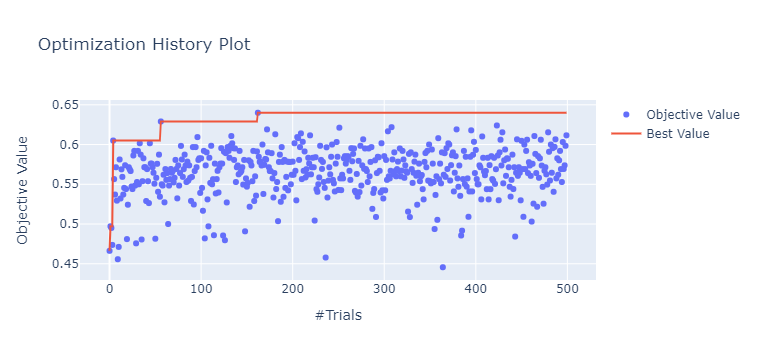

In [8]:
plot_optimization_history(study)

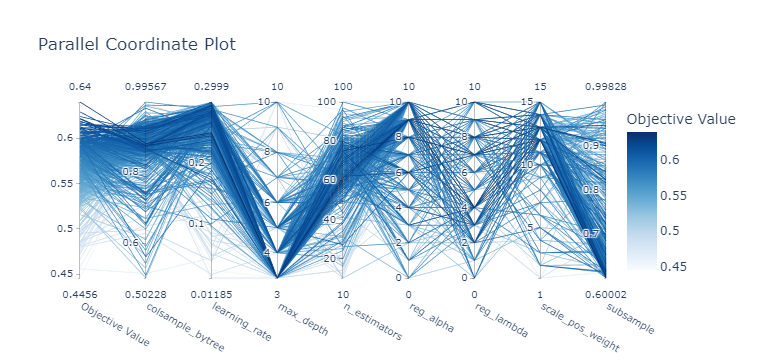

In [9]:
plot_parallel_coordinate(study)

In [10]:
# plot_contour(study)

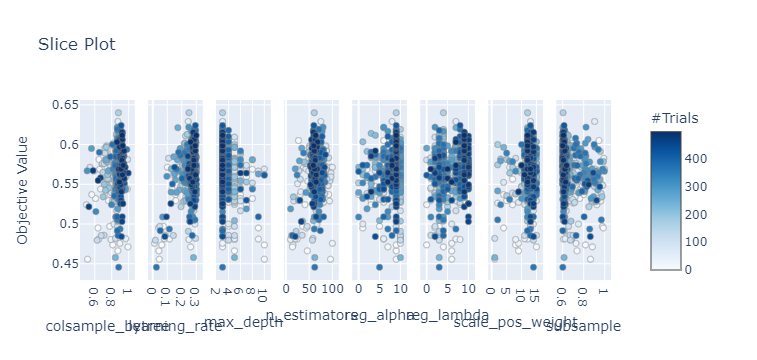

In [11]:
plot_slice(study)

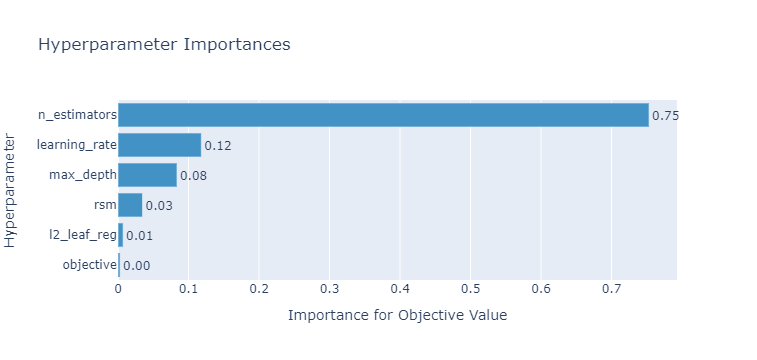

In [35]:
plot_param_importances(study)

In [46]:
# fit only subsets of array

def fit_subset(X, X_test, y_train, y_test, n_subsets):

    params = {
    'scale_pos_weight': 3,
    "n_estimators": 73,
    "learning_rate": 0.16,
    "num_leaves": 2060,
    "max_depth": 10
    }
    
    all_cols = np.array(X.columns)
    splits = np.array_split(all_cols, n_subsets)
    for subset, vals in zip(range(1, n_subsets+1), splits):
        print('\nSUBSET ---->', subset)
        df_sub_train = X[vals]
        df_sub_test = X_test[vals]
        means = []; stds = []; medians = []; kurts = []; skews = []; maxs = []; mins = []
        peaks = []; rms = []; p2p = []; var = []; crest_factor = []

        for idx, row in df_sub_train.iterrows():
            means.append(np.mean(row.values))
            stds.append(np.std(row.values))
            medians.append(np.median(row.values))
            kurts.append(stats.kurtosis(row.values))
            skews.append(stats.skew(row.values))
            maxs.append(np.max(row.values))
            mins.append(np.min(row.values))
            peaks.append(np.max(np.abs(row.values)))
            rms.append(np.sqrt(np.mean(row.values**2)))
            p2p.append(np.ptp(row.values))
            var.append(np.var(row.values))
            crest_factor.append(np.max(np.abs(row.values))/np.sqrt(np.mean(row.values**2)))

        X_features_train = pd.DataFrame({    
                                f"mean": means, f"std_": stds,
                                f"median": medians, f"kurtosis": kurts,
                                f"skew": skews, f"max": maxs, f"min": mins,
                                f"peaks": peaks, f"rms": rms, f"p2p": p2p,
                                f"var": var, f"crest_factor": crest_factor
                                })
        
        means = []; stds = []; medians = []; kurts = []; skews = []; maxs = []; mins = []
        peaks = []; rms = []; p2p = []; var = []; crest_factor = []
        
        for idx, row in df_sub_test.iterrows():
            means.append(np.mean(row.values))
            stds.append(np.std(row.values))
            medians.append(np.median(row.values))
            kurts.append(stats.kurtosis(row.values))
            skews.append(stats.skew(row.values))
            maxs.append(np.max(row.values))
            mins.append(np.min(row.values))
            peaks.append(np.max(np.abs(row.values)))
            rms.append(np.sqrt(np.mean(row.values**2)))
            p2p.append(np.ptp(row.values))
            var.append(np.var(row.values))
            crest_factor.append(np.max(np.abs(row.values))/np.sqrt(np.mean(row.values**2)))

        X_features_test = pd.DataFrame({    
                                f"mean": means, f"std_": stds,
                                f"median": medians, f"kurtosis": kurts,
                                f"skew": skews, f"max": maxs, f"min": mins,
                                f"peaks": peaks, f"rms": rms, f"p2p": p2p,
                                f"var": var, f"crest_factor": crest_factor
                                })
        
        study = optuna.create_study(sampler=TPESampler(), direction='maximize')
        study.optimize(objective, n_trials=200)

        params = {
            'scale_pos_weight': trial.params['scale_pos_weight'],
            "n_estimators": trial.params['n_estimators'],
            "learning_rate": trial.params['learning_rate'],
            "num_leaves": trial.params['num_leaves'],
            "max_depth": trial.params['max_depth']
            }
        
        model = LGBMClassifier(**params)

        model, df_metrics = fit_model_no_train_test(model, 
            X_features_train, X_features_test, y_train, y_test, f'{subset}')



fit_subset(X_train, X_test, y_train, y_test, 10)


SUBSET ----> 1


[I 2023-03-22 14:19:55,187] A new study created in memory with name: no-name-783bfae3-2463-48cb-8209-084de0bd3742
[I 2023-03-22 14:19:56,148] Trial 0 finished with value: 0.6250001 and parameters: {'scale_pos_weight': 4, 'n_estimators': 62, 'learning_rate': 0.8545279940373669, 'num_leaves': 1620, 'max_depth': 8}. Best is trial 0 with value: 0.6250001.
[I 2023-03-22 14:19:56,713] Trial 1 finished with value: 0.5652174913043476 and parameters: {'scale_pos_weight': 1, 'n_estimators': 77, 'learning_rate': 0.15689414778480346, 'num_leaves': 2780, 'max_depth': 5}. Best is trial 0 with value: 0.6250001.
[I 2023-03-22 14:20:19,409] Trial 2 finished with value: 0.6041667666666666 and parameters: {'scale_pos_weight': 7, 'n_estimators': 86, 'learning_rate': 0.7141623732699927, 'num_leaves': 4380, 'max_depth': 11}. Best is trial 0 with value: 0.6250001.
[I 2023-03-22 14:20:19,702] Trial 3 finished with value: 0.5894737842105263 and parameters: {'scale_pos_weight': 4, 'n_estimators': 30, 'learning_

ACCURACY: 0.715
BALANCED ACCURACY 0.647
F-SCORE: 0.495
PRECISION: 0.5
RECALL: 0.49
AUC ROC: 0.647

SUBSET ----> 2


[I 2023-03-22 14:23:38,529] A new study created in memory with name: no-name-1a2dae1a-8058-42bd-91c6-6be747f16515
[I 2023-03-22 14:23:38,623] Trial 0 finished with value: 0.6153847153846154 and parameters: {'scale_pos_weight': 12, 'n_estimators': 57, 'learning_rate': 0.554321683038259, 'num_leaves': 1040, 'max_depth': 3}. Best is trial 0 with value: 0.6153847153846154.
[I 2023-03-22 14:23:38,809] Trial 1 finished with value: 0.6136364636363636 and parameters: {'scale_pos_weight': 1, 'n_estimators': 93, 'learning_rate': 0.3979509116190566, 'num_leaves': 1160, 'max_depth': 5}. Best is trial 0 with value: 0.6153847153846154.
[I 2023-03-22 14:23:38,979] Trial 2 finished with value: 0.6451613903225806 and parameters: {'scale_pos_weight': 5, 'n_estimators': 51, 'learning_rate': 0.5448956342022107, 'num_leaves': 4080, 'max_depth': 6}. Best is trial 2 with value: 0.6451613903225806.
[I 2023-03-22 14:23:39,117] Trial 3 finished with value: 0.6067416730337077 and parameters: {'scale_pos_weight':

ACCURACY: 0.687
BALANCED ACCURACY 0.652
F-SCORE: 0.509
PRECISION: 0.46
RECALL: 0.569
AUC ROC: 0.652

SUBSET ----> 3


[I 2023-03-22 14:28:07,062] A new study created in memory with name: no-name-7cdf9af9-7a24-437a-b353-e419cc85707d
[I 2023-03-22 14:28:07,248] Trial 0 finished with value: 0.631579047368421 and parameters: {'scale_pos_weight': 15, 'n_estimators': 85, 'learning_rate': 0.3682147922681668, 'num_leaves': 780, 'max_depth': 4}. Best is trial 0 with value: 0.631579047368421.
[I 2023-03-22 14:28:07,360] Trial 1 finished with value: 0.5894737842105263 and parameters: {'scale_pos_weight': 9, 'n_estimators': 55, 'learning_rate': 0.6781569576450566, 'num_leaves': 580, 'max_depth': 4}. Best is trial 0 with value: 0.631579047368421.
[I 2023-03-22 14:28:07,527] Trial 2 finished with value: 0.5607477635514018 and parameters: {'scale_pos_weight': 9, 'n_estimators': 31, 'learning_rate': 0.5073127055997497, 'num_leaves': 4680, 'max_depth': 6}. Best is trial 0 with value: 0.631579047368421.
[I 2023-03-22 14:28:07,777] Trial 3 finished with value: 0.6236560139784946 and parameters: {'scale_pos_weight': 6, '

ACCURACY: 0.698
BALANCED ACCURACY 0.683
F-SCORE: 0.55
PRECISION: 0.478
RECALL: 0.647
AUC ROC: 0.683

SUBSET ----> 4


[I 2023-03-22 14:31:24,459] A new study created in memory with name: no-name-d7677679-0caa-4acd-82e6-0b7c4d9a1984
[I 2023-03-22 14:31:24,575] Trial 0 finished with value: 0.577319687628866 and parameters: {'scale_pos_weight': 8, 'n_estimators': 33, 'learning_rate': 0.9411233548450715, 'num_leaves': 1620, 'max_depth': 4}. Best is trial 0 with value: 0.577319687628866.
[I 2023-03-22 14:31:25,459] Trial 1 finished with value: 0.5806452612903226 and parameters: {'scale_pos_weight': 1, 'n_estimators': 78, 'learning_rate': 0.5319718670872481, 'num_leaves': 3880, 'max_depth': 10}. Best is trial 1 with value: 0.5806452612903226.
[I 2023-03-22 14:31:27,015] Trial 2 finished with value: 0.6382979723404255 and parameters: {'scale_pos_weight': 3, 'n_estimators': 80, 'learning_rate': 0.968841431659091, 'num_leaves': 3820, 'max_depth': 8}. Best is trial 2 with value: 0.6382979723404255.
[I 2023-03-22 14:31:28,723] Trial 3 finished with value: 0.6126127126126125 and parameters: {'scale_pos_weight': 8

ACCURACY: 0.642
BALANCED ACCURACY 0.608
F-SCORE: 0.458
PRECISION: 0.403
RECALL: 0.529
AUC ROC: 0.608

SUBSET ----> 5


[I 2023-03-22 14:36:53,475] A new study created in memory with name: no-name-955df4e4-e0cf-4a37-bd23-b701eb0f0bfb
[I 2023-03-22 14:36:53,656] Trial 0 finished with value: 0.5747127436781608 and parameters: {'scale_pos_weight': 1, 'n_estimators': 25, 'learning_rate': 0.36406254888196765, 'num_leaves': 4540, 'max_depth': 9}. Best is trial 0 with value: 0.5747127436781608.
[I 2023-03-22 14:36:53,848] Trial 1 finished with value: 0.6041667666666666 and parameters: {'scale_pos_weight': 9, 'n_estimators': 45, 'learning_rate': 0.45893304621987263, 'num_leaves': 4340, 'max_depth': 7}. Best is trial 1 with value: 0.6041667666666666.
[I 2023-03-22 14:36:54,563] Trial 2 finished with value: 0.5957447808510639 and parameters: {'scale_pos_weight': 7, 'n_estimators': 99, 'learning_rate': 0.4112505113192807, 'num_leaves': 3280, 'max_depth': 10}. Best is trial 1 with value: 0.6041667666666666.
[I 2023-03-22 14:36:54,628] Trial 3 finished with value: 0.626087056521739 and parameters: {'scale_pos_weight

ACCURACY: 0.654
BALANCED ACCURACY 0.646
F-SCORE: 0.508
PRECISION: 0.427
RECALL: 0.627
AUC ROC: 0.646

SUBSET ----> 6


[I 2023-03-22 14:42:20,020] A new study created in memory with name: no-name-4f8eae7a-841c-47d2-9fa1-360b6c7850cc
[I 2023-03-22 14:42:28,534] Trial 0 finished with value: 0.6122449979591837 and parameters: {'scale_pos_weight': 14, 'n_estimators': 55, 'learning_rate': 0.26933130397642174, 'num_leaves': 2460, 'max_depth': 10}. Best is trial 0 with value: 0.6122449979591837.
[I 2023-03-22 14:42:29,084] Trial 1 finished with value: 0.631579047368421 and parameters: {'scale_pos_weight': 12, 'n_estimators': 56, 'learning_rate': 0.8825516034507221, 'num_leaves': 3180, 'max_depth': 6}. Best is trial 1 with value: 0.631579047368421.
[I 2023-03-22 14:42:32,679] Trial 2 finished with value: 0.5681819181818181 and parameters: {'scale_pos_weight': 2, 'n_estimators': 41, 'learning_rate': 0.09717748787248827, 'num_leaves': 1040, 'max_depth': 8}. Best is trial 1 with value: 0.631579047368421.
[I 2023-03-22 14:42:32,893] Trial 3 finished with value: 0.660377458490566 and parameters: {'scale_pos_weight'

ACCURACY: 0.687
BALANCED ACCURACY 0.657
F-SCORE: 0.517
PRECISION: 0.462
RECALL: 0.588
AUC ROC: 0.657

SUBSET ----> 7


[I 2023-03-22 14:44:25,803] A new study created in memory with name: no-name-74accb89-7d34-4de7-bd40-4904494557a8
[I 2023-03-22 14:44:26,300] Trial 0 finished with value: 0.6017700115044248 and parameters: {'scale_pos_weight': 14, 'n_estimators': 80, 'learning_rate': 0.07481138436369965, 'num_leaves': 1040, 'max_depth': 10}. Best is trial 0 with value: 0.6017700115044248.
[I 2023-03-22 14:44:26,430] Trial 1 finished with value: 0.6363637363636363 and parameters: {'scale_pos_weight': 7, 'n_estimators': 17, 'learning_rate': 0.058051340376292185, 'num_leaves': 3020, 'max_depth': 8}. Best is trial 1 with value: 0.6363637363636363.
[I 2023-03-22 14:44:26,679] Trial 2 finished with value: 0.6326531612244897 and parameters: {'scale_pos_weight': 3, 'n_estimators': 60, 'learning_rate': 0.14879723798720182, 'num_leaves': 2280, 'max_depth': 6}. Best is trial 1 with value: 0.6363637363636363.
[I 2023-03-22 14:44:26,921] Trial 3 finished with value: 0.5714286714285715 and parameters: {'scale_pos_we

ACCURACY: 0.682
BALANCED ACCURACY 0.665
F-SCORE: 0.529
PRECISION: 0.457
RECALL: 0.627
AUC ROC: 0.665

SUBSET ----> 8


[I 2023-03-22 14:47:51,551] A new study created in memory with name: no-name-05b77b33-d9f6-40a0-956e-cab6dc5a943f
[I 2023-03-22 14:47:56,421] Trial 0 finished with value: 0.6153847153846154 and parameters: {'scale_pos_weight': 12, 'n_estimators': 41, 'learning_rate': 0.36613644162573666, 'num_leaves': 1900, 'max_depth': 7}. Best is trial 0 with value: 0.6153847153846154.
[I 2023-03-22 14:47:57,120] Trial 1 finished with value: 0.6382979723404255 and parameters: {'scale_pos_weight': 3, 'n_estimators': 47, 'learning_rate': 0.9399352484078478, 'num_leaves': 4240, 'max_depth': 12}. Best is trial 1 with value: 0.6382979723404255.
[I 2023-03-22 14:47:57,371] Trial 2 finished with value: 0.6292135831460675 and parameters: {'scale_pos_weight': 1, 'n_estimators': 60, 'learning_rate': 0.4120071486142461, 'num_leaves': 4880, 'max_depth': 5}. Best is trial 1 with value: 0.6382979723404255.
[I 2023-03-22 14:47:57,679] Trial 3 finished with value: 0.5806452612903226 and parameters: {'scale_pos_weigh

ACCURACY: 0.648
BALANCED ACCURACY 0.624
F-SCORE: 0.479
PRECISION: 0.414
RECALL: 0.569
AUC ROC: 0.624

SUBSET ----> 9


[I 2023-03-22 14:50:57,251] A new study created in memory with name: no-name-c03fa682-577a-4fcf-9353-e1ca1217c438
[I 2023-03-22 14:50:59,019] Trial 0 finished with value: 0.6019418475728155 and parameters: {'scale_pos_weight': 11, 'n_estimators': 30, 'learning_rate': 0.8421254327993459, 'num_leaves': 3820, 'max_depth': 3}. Best is trial 0 with value: 0.6019418475728155.
[I 2023-03-22 14:51:02,530] Trial 1 finished with value: 0.6326531612244897 and parameters: {'scale_pos_weight': 11, 'n_estimators': 50, 'learning_rate': 0.6233985879553248, 'num_leaves': 2060, 'max_depth': 6}. Best is trial 1 with value: 0.6326531612244897.
[I 2023-03-22 14:51:02,790] Trial 2 finished with value: 0.6666667666666667 and parameters: {'scale_pos_weight': 6, 'n_estimators': 26, 'learning_rate': 0.18148388060451476, 'num_leaves': 4600, 'max_depth': 6}. Best is trial 2 with value: 0.6666667666666667.
[I 2023-03-22 14:51:03,043] Trial 3 finished with value: 0.5744681851063829 and parameters: {'scale_pos_weigh

ACCURACY: 0.676
BALANCED ACCURACY 0.673
F-SCORE: 0.54
PRECISION: 0.453
RECALL: 0.667
AUC ROC: 0.673

SUBSET ----> 10


[I 2023-03-22 14:53:09,323] A new study created in memory with name: no-name-0ddb7fe2-5911-42cc-9614-db9489a06888
[I 2023-03-22 14:53:09,932] Trial 0 finished with value: 0.6346154846153845 and parameters: {'scale_pos_weight': 11, 'n_estimators': 69, 'learning_rate': 0.14644000679063549, 'num_leaves': 3080, 'max_depth': 5}. Best is trial 0 with value: 0.6346154846153845.
[I 2023-03-22 14:53:10,013] Trial 1 finished with value: 0.5932204389830508 and parameters: {'scale_pos_weight': 9, 'n_estimators': 30, 'learning_rate': 0.19581181897522537, 'num_leaves': 2260, 'max_depth': 3}. Best is trial 0 with value: 0.6346154846153845.
[I 2023-03-22 14:53:19,613] Trial 2 finished with value: 0.6315790473684211 and parameters: {'scale_pos_weight': 11, 'n_estimators': 98, 'learning_rate': 0.03798788735242591, 'num_leaves': 3800, 'max_depth': 12}. Best is trial 0 with value: 0.6346154846153845.
[I 2023-03-22 14:53:19,917] Trial 3 finished with value: 0.577319687628866 and parameters: {'scale_pos_wei

ACCURACY: 0.654
BALANCED ACCURACY 0.628
F-SCORE: 0.483
PRECISION: 0.42
RECALL: 0.569
AUC ROC: 0.628


#### Shap Feature Selection

In [ ]:
# feature selection
import shap

def build_model(df, target, params):
    """
    Given the dataframe and target, build and return the model
    """
    y = df[target]

    X = df.drop(columns=[target])
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=.2, random_state=1066)

    train_pool = Pool(X_train, y_train)
    test_pool = Pool(X_test, y_test)

    model = CatBoostClassifier(**params)
    model.fit(X_train, y_train, eval_set=test_pool, use_best_model=True, early_stopping_rounds=10)
    f1 = f1_score(y_test, model.predict(X_test))
    acc = accuracy_score(y_test, model.predict(X_test))
    return f1, acc, model, X_test


def get_dropped_feature(model, X_test):
    explainer = shap.Explainer(model)
    shap_values = explainer(X_test)
    feature_importance = shap_values.abs.mean(0).values
    importance_df = pd.DataFrame({'features': X_test.columns,
                                  'importance': feature_importance})
    importance_df.sort_values(by='importance', ascending=False, inplace=True)
    return importance_df['features'].iloc[-1]
    

def backward_selection(df, target, params, max_features=None):
    """
    This function uses the SHAP importance from a catboost model
    to incrementally remove features from the training set until the RMSE no longer improves.
    This function returns the dataframe with the features that give the best RMSE.
    Return at most max_features.
    """
    # get baseline f1
    select_df = df.copy()
    total_features = df.shape[1]
    f1, acc, model, X_test = build_model(select_df, target, params)
    print(f"{f1} with {select_df.shape[1]}")
    last_f1 = f1
    
    # Drop least important feature and recalculate model peformance
    if max_features is None:
        max_features = total_features-1
        
    for num_features in range(total_features-1, 1, -1):
        # Trim features
        dropped_feature = get_dropped_feature(model, X_test)
        tmp_df = select_df.drop(columns=[dropped_feature])

        # Rerun modeling
        f1, acc, model, X_test = build_model(tmp_df, target, params)
        print(f"{f1} with {tmp_df.shape[1]}")
        if (num_features < max_features) and (f1 > last_f1):
            # RMSE increased, return last dataframe
            return select_df
        else:
            # RMSE improved, continue dropping features
            last_f1 = f1
            select_df = tmp_df
    return select_df

In [ ]:
params = {
        'boosting_type': 'Plain',
        'objective': 'Logloss',
        'verbose': 0,
        'used_ram_limit': '5gb',
        'random_seed': 1066
    }

X_preprocess = pd.DataFrame(preprocessing.SNV(X), columns=X.columns)
df_features = preprocessing.create_features(X_preprocess, n_subsets=28, mode='stats')
df_features['maligno'] = y
reduced_df = backward_selection(df_features, 'maligno', params, max_features=100)
f1, acc, _, _ = build_model(reduced_df, 'maligno', params)
print('f1:', f1, 'acc:', acc)

0.9253731343283583 with 191
0.9242424242424244 with 190
0.9333333333333335 with 189
0.9253731343283583 with 188
0.9333333333333335 with 187
0.9253731343283583 with 186
0.9333333333333335 with 185
0.9323308270676691 with 184
0.9253731343283583 with 183
0.9333333333333335 with 182
0.9323308270676691 with 181
0.9185185185185185 with 180
0.9402985074626866 with 179
0.9402985074626866 with 178
0.9402985074626866 with 177
0.9402985074626866 with 176
0.9264705882352942 with 175
0.9333333333333335 with 174
0.9333333333333335 with 173
0.9402985074626866 with 172
0.9323308270676691 with 171
0.9333333333333335 with 170
0.9402985074626866 with 169
0.9323308270676691 with 168
0.9333333333333335 with 167
0.9333333333333335 with 166
0.9402985074626866 with 165
0.9253731343283583 with 164
0.9185185185185185 with 163
0.9323308270676691 with 162
0.9253731343283583 with 161
0.9333333333333335 with 160
0.9333333333333335 with 159
0.9264705882352942 with 158
0.9090909090909091 with 157
0.9117647058823528 w

#### PSO

In [35]:
def fitness_function_pso(solution):
    global model, X, y
    list_acc = []
    for sol in solution:
        n_subs = int(round(sol[0], 0))
        df_features = preprocessing.create_features_all(X, n_subs)
        X_train, X_test, y_train, y_test = train_test_split(df_features, y, test_size=0.25)
        model.fit(X_train, y_train)
        y_pred = model.predict(X_test)
        # score = accuracy_score(y_test, y_pred)
        score = f1_score(y_test, y_pred)
        list_acc.append(1.0 - (score + 0.0000001))
        # usar f-score
    return list_acc

In [36]:
# X = preprocessing.create_features(X_snv, n_subsets=10)
model = train.simple_random_forest()

max_bound = np.array([40])
min_bound = np.array([10])
bounds = (min_bound, max_bound)

options = {'c1': 0.5, 'c2': 0.3, 'w':0.9}
optimizer = ps.single.GlobalBestPSO(n_particles=20, dimensions=1, options=options, bounds=bounds)
cost, pos = optimizer.optimize(fitness_function_pso, iters=10)

2022-06-04 19:48:57,055 - pyswarms.single.global_best - INFO - Optimize for 10 iters with {'c1': 0.5, 'c2': 0.3, 'w': 0.9}
pyswarms.single.global_best: 100%|██████████|10/10, best_cost=0.0254
2022-06-04 20:05:15,672 - pyswarms.single.global_best - INFO - Optimization finished | best cost: 0.025380610659898495, best pos: [15.78573091]


#### GA

In [37]:
def fitness_function_ga(solution, solution_idx):
    global model, X, y
    n_subsets = int(round(solution[0], 0))
    df_features = preprocessing.create_features_all(X, n_subsets)
    X_train, X_test, y_train, y_test = train_test_split(df_features, y, test_size=0.25)
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    # score = accuracy_score(y_test, y_pred)
    score = f1_score(y_test, y_pred)
    return (score + 0.0000001)


def on_gen(ga_instance):
    generation = ga_instance.generations_completed
    fitness = ga_instance.best_solution(ga_instance.last_generation_fitness)[1]
    print(f"Generation {generation}: Fitness = {round(fitness, 3)}")
    # print("Fitness = {fitness}".format(fitness=ga_instance.best_solution(ga_instance.last_generation_fitness)[1]))

In [38]:
num_parents_mating = 4

sol_per_pop = 8
num_genes = 1
init_range_low = 10
init_range_high = 40

keep_parents = 2
mutation_percent_genes = 10

ga_instance = pygad.GA(num_generations=50,
                       num_parents_mating=num_parents_mating,
                       fitness_func=fitness_function_ga,
                       sol_per_pop=sol_per_pop,
                       num_genes=num_genes,
                       init_range_low=init_range_low,
                       init_range_high=init_range_high,
                       keep_parents=keep_parents,
                       on_generation=on_gen,
                       mutation_percent_genes=mutation_percent_genes)

ga_instance.run()
solution, solution_fitness, solution_idx = ga_instance.best_solution()
print("Parameters of the best solution : {solution}".format(solution=solution))
print("Fitness value of the best solution = {solution_fitness}".format(solution_fitness=solution_fitness))

Generation 1: Fitness = 0.948
Generation 2: Fitness = 0.952
Generation 3: Fitness = 0.952
Generation 4: Fitness = 0.952
Generation 5: Fitness = 0.952
Generation 6: Fitness = 0.952
Generation 7: Fitness = 0.952
Generation 8: Fitness = 0.952
Generation 9: Fitness = 0.964
Generation 10: Fitness = 0.964
Generation 11: Fitness = 0.964
Generation 12: Fitness = 0.964
Generation 13: Fitness = 0.964
Generation 14: Fitness = 0.964
Generation 15: Fitness = 0.964
Generation 16: Fitness = 0.964
Generation 17: Fitness = 0.964
Generation 18: Fitness = 0.964
Generation 19: Fitness = 0.964
Generation 20: Fitness = 0.964
Generation 21: Fitness = 0.964
Generation 22: Fitness = 0.964
Generation 23: Fitness = 0.969
Generation 24: Fitness = 0.969
Generation 25: Fitness = 0.969
Generation 26: Fitness = 0.969
Generation 27: Fitness = 0.969
Generation 28: Fitness = 0.969
Generation 29: Fitness = 0.969
Generation 30: Fitness = 0.969
Generation 31: Fitness = 0.969
Generation 32: Fitness = 0.974
Generation 33: Fi